<a href="https://colab.research.google.com/github/vssood/WU_DL/blob/master/WU_DL_WK6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 6: CNN for Vision

### Part 6.1: Image Processing in Python

In [ ]:
from PIL import Image, ImageFile
from matplotlib.pyplot import imshow
import requests
from io import BytesIO
import numpy as np

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/9/92/Brookings.jpg"

[[[ 86 133 177]
  [ 85 132 176]
  [ 84 133 176]
  ...
  [ 94 128 153]
  [ 91 128 155]
  [ 94 129 169]]

 [[ 86 133 177]
  [ 88 135 179]
  [ 88 137 180]
  ...
  [ 96 133 159]
  [ 92 136 165]
  [ 99 141 183]]

 [[ 83 130 174]
  [ 87 134 178]
  [ 89 138 181]
  ...
  [108 150 175]
  [100 149 179]
  [ 97 144 186]]

 ...

 [[127  77  76]
  [131  81  80]
  [128  80  76]
  ...
  [  4  10  10]
  [  2  11  10]
  [  2  11  10]]

 [[132  81  77]
  [129  80  75]
  [124  75  70]
  ...
  [  4  10  10]
  [  3  12  11]
  [  3  12  11]]

 [[140  90  83]
  [137  87  80]
  [130  81  74]
  ...
  [ 11  17  17]
  [ 10  19  18]
  [ 10  19  18]]]


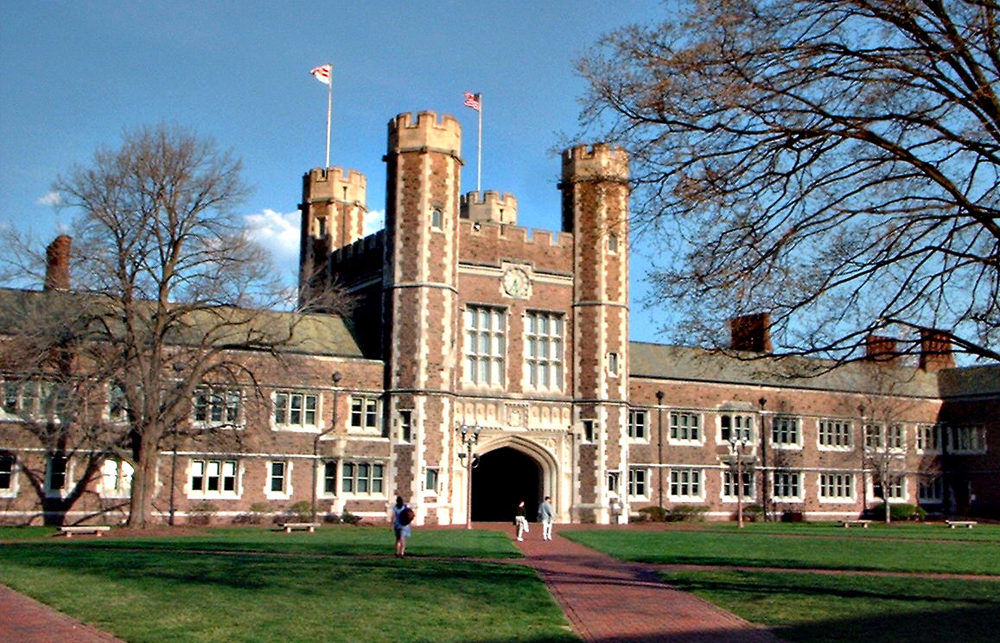

In [ ]:
# load the file from url 
response = requests.get(url)
img =Image.open(BytesIO(response.content))
img.load()

# show the np array content of the img 
print(np.asarray(img))

img

### Creating Images (from pixels) in Python

Use pillows to create a 3D image 
row & Col - specfies the pixcle 
depth - RBG is the 3r

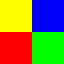

In [ ]:
w, h = 64, 64
data = np.zeros((h, w, 3), dtype =np.uint8)     # Stored as  bytes - important

# Yellow 
for row in range(32):
    for col in range(32):
        data[row, col] = [255, 255, 0]

# Red 
for row in range(32):
    for col in range(32):
        data[row+32, col] = [255, 0, 0]

# Green
for row in range(32):
    for col in range(32):
        data[row+32, col+32] = [0, 255, 0]

# Green
for row in range(32):
    for col in range(32):
        data[row, col+32] = [0, 0, 255]
img = Image.fromarray(data, 'RGB')
img

Transform the image in python at pixle level 

make it gray scale 


In [ ]:
response= requests.get(url)
img = Image.open(BytesIO(response.content))
img.load()

img_array = np.asarray(img)
rows = img_array.shape[0]
cols = img_array.shape[1]

print("Rows {}, Cols: {}".format(rows, cols))


Rows 744, Cols: 1157


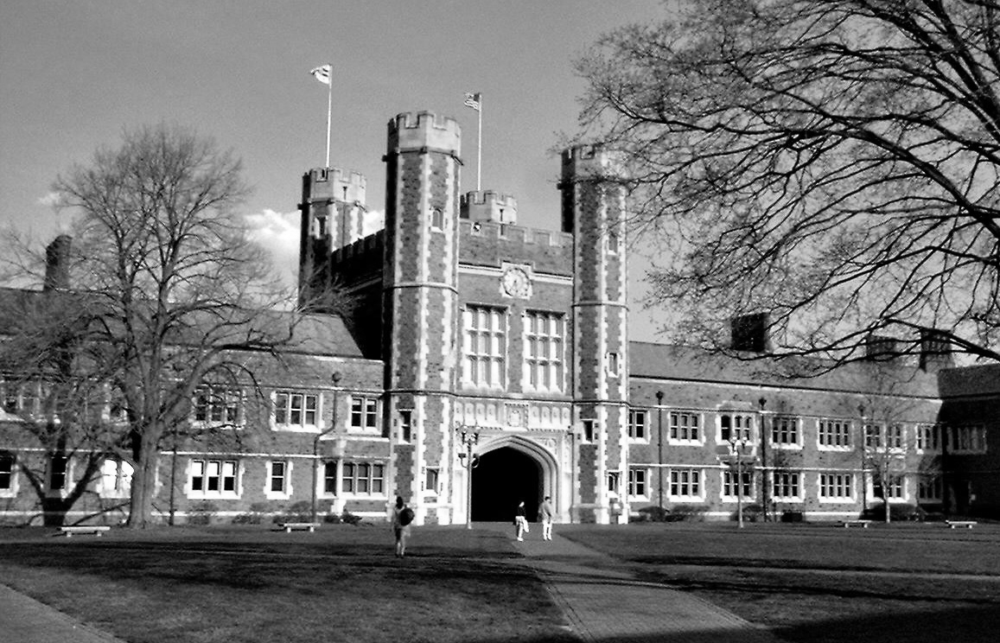

In [ ]:
# Creat a new image 
img2_array = np.zeros((rows, cols, 3), dtype=np.uint8)

# Loop over each pixle and update the image value with average values
for row in range(rows):
    for col in range(cols):
        t = np.mean(img_array[row, col])    # mean of each pixle
        img2_array[row,col] = [t,t,t]

img2 = Image.fromarray(img2_array, "RGB")
img2

Standadize image 

make all images of the same square size 

In [ ]:
images = [
    "https://upload.wikimedia.org/wikipedia/commons/9/92/Brookings.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/f/ff/"\
        "WashU_Graham_Chapel.JPG",
    "https://upload.wikimedia.org/wikipedia/commons/9/9e/SeigleHall.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/a/aa/WUSTLKnight.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/3/32/WashUABhall.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/c/c0/Brown_Hall.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/f/f4/South40.jpg"    
]

In [ ]:
# Square image
def make_square(img):
    cols, rows =img.size
    extra = abs(rows-cols)/ 2
    print(rows, cols, extra)
    if rows > cols:
        r = (0, extra, cols, cols+extra)                #left, upper, right, and lower pixel 
    else:
        r = (extra, 0, rows+extra, rows)
    print(r)
    return img.crop(r)

744 1157 206.5
(206.5, 0, 950.5, 744)


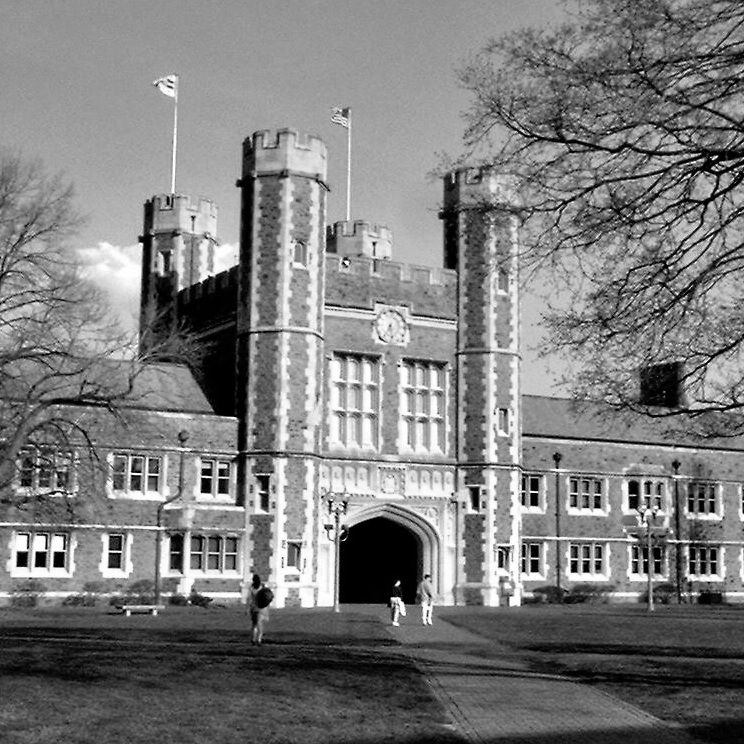

In [ ]:
make_square(img2)

744 1157 206.5
(206.5, 0, 950.5, 744)
https://upload.wikimedia.org/wikipedia/commons/9/92/Brookings.jpg


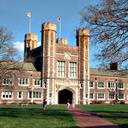

2592 3888 648.0
(648.0, 0, 3240.0, 2592)
https://upload.wikimedia.org/wikipedia/commons/f/ff/WashU_Graham_Chapel.JPG


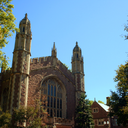

2419 3888 734.5
(734.5, 0, 3153.5, 2419)
https://upload.wikimedia.org/wikipedia/commons/9/9e/SeigleHall.jpg


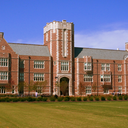

1704 2272 284.0
(284.0, 0, 1988.0, 1704)
https://upload.wikimedia.org/wikipedia/commons/a/aa/WUSTLKnight.jpg


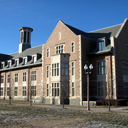

2185 3700 757.5
(757.5, 0, 2942.5, 2185)
https://upload.wikimedia.org/wikipedia/commons/3/32/WashUABhall.jpg


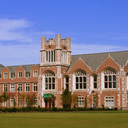

1834 2816 491.0
(491.0, 0, 2325.0, 1834)
https://upload.wikimedia.org/wikipedia/commons/c/c0/Brown_Hall.jpg


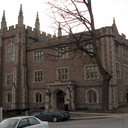

1696 2544 424.0
(424.0, 0, 2120.0, 1696)
https://upload.wikimedia.org/wikipedia/commons/f/f4/South40.jpg


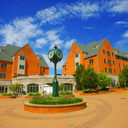

(7, 49152)


In [ ]:
x = []
for url in images:
    ImageFile.LOAD_TRUNCATED_IMAGES = False
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.load()
    img = make_square(img)
    img = img.resize((128, 128), Image.ANTIALIAS)
    print(url)
    display(img)

# Convert the images to numbers, flatten it for use in neural network 
    img_array = np.asarray(img)
    img_array = img_array.flatten()
    img_array = img_array.astype(np.float32)
    img_array = (img_array-128)/128  #range between -1 & 1 center at 0
    x.append(img_array) 

x = np.array(x)
print(x.shape)

***Adding Noice to the image ***

random noice to the image 

In [ ]:
def add_noise(a):
    a2 = a.copy()
    rows = a2.shape[0]
    cols = a2.shape[1]
    s = int(min(rows, cols)/20)  # size of spot if 1/20th of smalles dimension

    for i in range(100):
        x = np.random.randint(cols-s)
        y = np.random.randint(rows - s)
        a2[y: (y+s), x:(x+s)] = 0           # make it black 
    return a2

Rows744, Cols:1157
(744, 1157, 3)


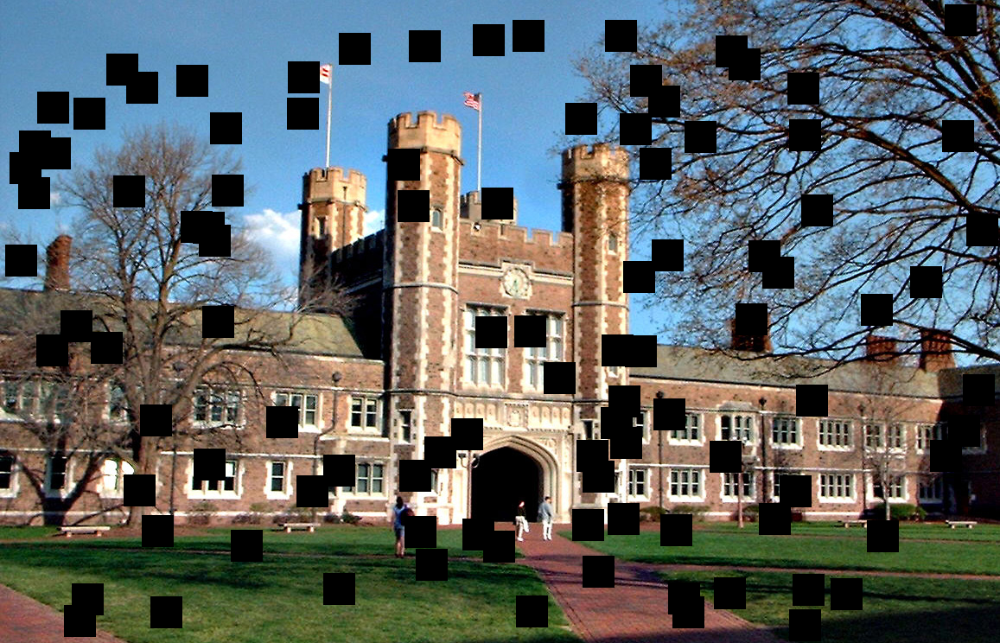

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/9/92/Brookings.jpg"

response = requests.get(url)
img = Image.open(BytesIO(response.content))
img.load()

img_array = np.asarray(img)
rows = img_array.shape[0]
cols = img_array.shape[1]

print("Rows{}, Cols:{}".format(rows, cols))

# create a new image 
img2_array = img_array.astype(np.uint8)
print(img2_array.shape)
img2_array = add_noise(img2_array)
img2 = Image.fromarray(img2_array, 'RGB')

img2

### Part 6.2: Keras Neural Networks for Digits and Fashion MNIST

**Computer Vision**

In [ ]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras import regularizers
from tensorflow.keras import backend as k 

import matplotlib.pyplot as plt
import numpy as np

from IPython.display import display
import pandas as pd 

import random 
import time


In [ ]:
from tensorflow.keras.datasets import mnist

In [ ]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


In [ ]:
print("Shape of x_train:{}".format(x_train.shape))
print("Shape of y_train:{}".format(y_train.shape))
print()
print("Shape of x_test:{}".format(x_test.shape))
print("Shape of y_test:{}".format(y_test.shape))

Shape of x_train:(60000, 28, 28)
Shape of y_train:(60000,)

Shape of x_test:(10000, 28, 28)
Shape of y_test:(10000,)


Display Digits 

In [ ]:
# single MNIST digit 
single = x_train[0]
print("Shape for single :{}".format(single.shape))

pd.DataFrame(single.reshape(28,28))

Shape for single :(28, 28)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,3,18,18,18,126,136,175,26,166,255,247,127,0,0,0,0
6,0,0,0,0,0,0,0,0,30,36,94,154,170,253,253,253,253,253,225,172,253,242,195,64,0,0,0,0
7,0,0,0,0,0,0,0,49,238,253,253,253,253,253,253,253,253,251,93,82,82,56,39,0,0,0,0,0
8,0,0,0,0,0,0,0,18,219,253,253,253,253,253,198,182,247,241,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,80,156,107,253,253,205,11,0,43,154,0,0,0,0,0,0,0,0,0,0


Image (#185): Which is Digit '7'


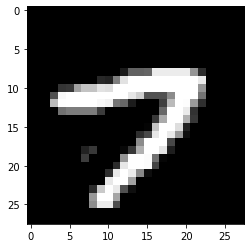

In [ ]:
digit = 185
a = x_train[digit]

plt.imshow(a, cmap ='gray', interpolation='nearest')
print("Image (#{}): Which is Digit '{}'".format(digit, y_train[digit]))

**Sub plot the data**

<Figure size 432x288 with 0 Axes>

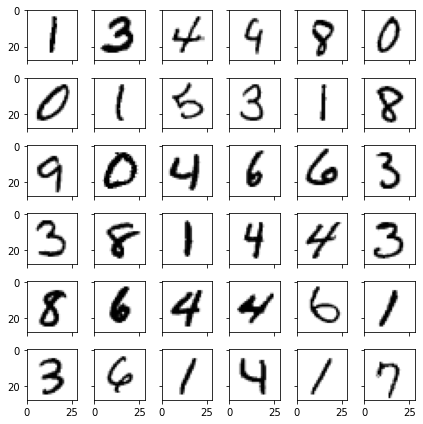

In [ ]:
rows = 6
random_indices = random.sample(range(x_train.shape[0]),  rows * rows)  # Select 36 images out of 60,000

sample_images = x_train[random_indices, :]

plt.clf()       # clear the current figure 

fig, axes = plt.subplots(rows, rows, 
                        figsize = (rows, rows),
                        sharex = True, sharey=True)


for i in range(rows*rows):
    subplot_row = i // rows
    subplot_col = i%rows

    ax = axes[subplot_row, subplot_col]
    plottable_image = np.reshape(sample_images[i, :], (28, 28))
    ax.imshow(plottable_image, cmap = 'gray_r')
    ax.set_xbound([0,28])

plt.tight_layout()
plt.show()

In [ ]:
def create_model(x_train, y_test, x_test, y_train, input_shape, num_classes):

    model = Sequential()
    model.add(Conv2D(32, kernel_size=(3, 3),
                     activation = 'relu',
                     input_shape = input_shape  ))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu' ))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())             # always needed when moving from 2D to Dense layer
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer = 'adam',
            metrics = ['accuracy'])
    return model

Process Images 

In [ ]:
batch_size = 128
num_classes = 10
epochs = 12

print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)
# input image dimension 
img_rows, img_cols = 28, 28

# Get the data by H, W by color ( Depth  )
if k.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

# change the format of the data
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# Normalize the data - get the data between 0 & 1 (can also center around 0 by munus & divid by 128)
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print("Training samples: {}".format(x_train.shape[0]))
print("Test samples: {}".format(x_test.shape[0]))

# convert class vectors to binary class matrices
y_train = tensorflow.keras.utils.to_categorical(y_train, num_classes)
y_test = tensorflow.keras.utils.to_categorical(y_test, num_classes)

model = create_model(x_train, y_train, x_test,  y_test, input_shape, num_classes)

(60000, 28, 28) (60000,) (10000, 28, 28) (10000,)
x_train shape: (60000, 28, 28, 1)
Training samples: 60000
Test samples: 10000


Train the Dataset 

In [ ]:
x_train.shape, y_train.shape

((60000, 28, 28, 1), (60000, 10))

In [ ]:
start_time = time.time()

model.fit(x_train, y_train, 
          batch_size = batch_size,
          epochs = epochs,
          verbose = 0,
          validation_data = (x_test, y_test))


score = model.evaluate(x_test, y_test, verbose = 0)
print("Test Loss: {} ".format(score[0]))
print("Test Accuracy: {} ".format(score[1]))

elapsed_time = time.time() - start_time
print("Elapsed time: {}".format(elapsed_time))

Test Loss: 0.03237352520227432 
Test Accuracy: 0.9901999831199646 
Elapsed time: 75.2782461643219


## **MNIST Fashion**

In [ ]:
import tensorflow.keras
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.datasets import fashion_mnist

import random
import matplotlib.pyplot as plt
import numpy as np

# Display as text
from IPython.display import display
import pandas as pd

In [ ]:
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()
print("Shape of x_train: {}".format(x_train.shape))
print("Shape of y_train: {}".format(y_train.shape))
print()
print("Shape of x_test: {}".format(x_test.shape))
print("Shape of y_test: {}".format(y_test.shape))

Shape of x_train: (60000, 28, 28)
Shape of y_train: (60000,)

Shape of x_test: (10000, 28, 28)
Shape of y_test: (10000,)


**Display of Apparel**

In [ ]:
print("Shape for dataset {}".format(x_train.shape))
print("Labels: {}".format(y_train))

# print single MNIST Fashion 
single = x_train[0]
print("Shape for single: {}".format(single.shape))

# Display dataset
pd.set_option("display.max_columns", 7)
pd.set_option("display.max_rows", 5)
pd.DataFrame(single.reshape(28, 28))

Shape for dataset (60000, 28, 28)
Labels: [9 0 0 ... 3 0 5]
Shape for single: (28, 28)


,0,1,2,...,25,26,27
0,0,0,0,...,0,0,0
1,0,0,0,...,0,0,0
...,...,...,...,...,...,...,...
26,0,0,0,...,0,0,0
27,0,0,0,...,0,0,0


Image (#105): which is digit '8'


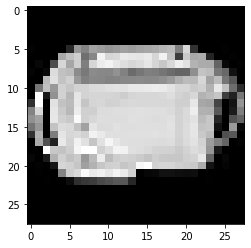

In [ ]:
# Display one image 
digit = 105
a = x_train[digit]
plt.imshow(a, cmap = 'gray', interpolation='nearest' )
print("Image (#{}): which is digit '{}'". format(digit, y_train[digit]))

<Figure size 432x288 with 0 Axes>

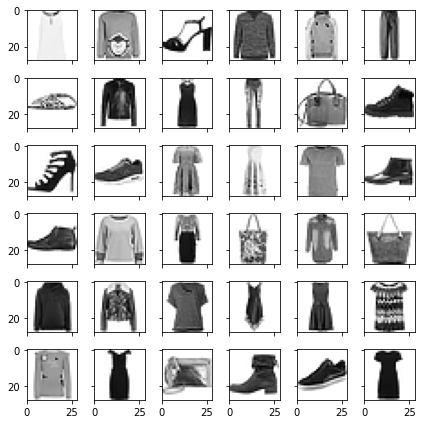

In [ ]:
rows = 6
random_indices = random.sample(range(x_train.shape[0]), rows * rows)
sample_images = x_train[random_indices, :]
plt.clf()

fig, axes = plt.subplots(rows, rows, 
                         figsize=(rows, rows),
                         sharex=True, sharey=True) 


for i in range(rows*rows):
    subplot_row = i//rows 
    subplot_col = i%rows  

    ax = axes[subplot_row, subplot_col]

    plottable_image = np.reshape(sample_images[i,:], (28,28))
    # print(plottable_image)
    ax.imshow(plottable_image, cmap='gray_r')
    ax.set_xbound([0,28])

plt.tight_layout()
plt.show()    

**Training/Fitting CNN - Fashion**

In [ ]:
import tensorflow.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K 

from tensorflow.keras.datasets import fashion_mnist

import random
import matplotlib.pyplot as plt
import numpy as np

# Display as text
from IPython.display import display
import pandas as pd


import tensorflow as tf
import time

In [ ]:
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


In [ ]:
batch_size = 128
num_classes = 10
epochs = 12

# input image dimensions 
img_rows, img_cols = 28, 28

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test  = x_test.reshape(x_test.reshape[0], 1, img_rows, img_cols)
    input_Shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test  = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype( 'float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

print('x_train_Shape', x_train.shape)
print("Training Samples: {}".format(x_train.shape[0]))
print("Test Samples : {}".format(x_test.shape[0]))

# convert class vectors to binary class matrices
y_train = tensorflow.keras.utils.to_categorical(y_train, num_classes)
y_test = tensorflow.keras.utils.to_categorical(y_test, num_classes)

x_train_Shape (60000, 28, 28, 1)
Training Samples: 60000
Test Samples : 10000


In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Conv2D(32, kernel_size=(3,3), 
                     activation = 'relu',
                     input_shape = input_shape))
    model.add(Conv2D( 64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax')) # Output layer 
    model.compile(loss = 'categorical_crossentropy', optimizer='adam',
              metrics=['accuracy'])
    return model

In [ ]:
model = create_model(input_shape)

start_time = time.time()
model.fit(x_train, y_train, 
          batch_size = batch_size,
          epochs = epochs,
          verbose = 2,
          validation_data = (x_test, y_test))

score = model.evaluate(x_test, y_test, verbose = 0)

print("Test Loss : {}".format(score[0]))
print("Test Accuracy : {}".format(score[1]))

elapsed_time = time.time() - start_time
print("Elapsed time: {}".format(elapsed_time))

Epoch 1/12
469/469 - 7s - loss: 0.5320 - accuracy: 0.8119 - val_loss: 0.3323 - val_accuracy: 0.8816
Epoch 2/12
469/469 - 6s - loss: 0.3433 - accuracy: 0.8780 - val_loss: 0.3040 - val_accuracy: 0.8911
Epoch 3/12
469/469 - 6s - loss: 0.2933 - accuracy: 0.8944 - val_loss: 0.2618 - val_accuracy: 0.9044
Epoch 4/12
469/469 - 6s - loss: 0.2648 - accuracy: 0.9009 - val_loss: 0.2525 - val_accuracy: 0.9087
Epoch 5/12
469/469 - 6s - loss: 0.2397 - accuracy: 0.9132 - val_loss: 0.2358 - val_accuracy: 0.9131
Epoch 6/12
469/469 - 6s - loss: 0.2168 - accuracy: 0.9205 - val_loss: 0.2326 - val_accuracy: 0.9147
Epoch 7/12
469/469 - 6s - loss: 0.2018 - accuracy: 0.9250 - val_loss: 0.2214 - val_accuracy: 0.9202
Epoch 8/12
469/469 - 6s - loss: 0.1871 - accuracy: 0.9310 - val_loss: 0.2159 - val_accuracy: 0.9236
Epoch 9/12
469/469 - 6s - loss: 0.1765 - accuracy: 0.9339 - val_loss: 0.2151 - val_accuracy: 0.9219
Epoch 10/12
469/469 - 6s - loss: 0.1611 - accuracy: 0.9407 - val_loss: 0.2181 - val_accuracy: 0.9250

## **Part 6.3: Implementing a ResNet in Keras**

**CIFAR Dataset**

In [ ]:
import tensorflow.keras
from tensorflow.keras.layers import Dense, Conv2D
from tensorflow.keras.layers import BatchNormalization, Activation
from tensorflow.keras.layers import AveragePooling2D, Input, Flatten
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.regularizers import l2
from tensorflow.keras import backend as K 
from tensorflow.keras.models import Model
from tensorflow.keras.datasets import cifar10
import numpy as np
import os

import matplotlib.pyplot as plt
from six.moves import cPickle

In [ ]:
# Load CIFAR10 data
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

170500096/170498071 [==============================] - 2s 0us/step


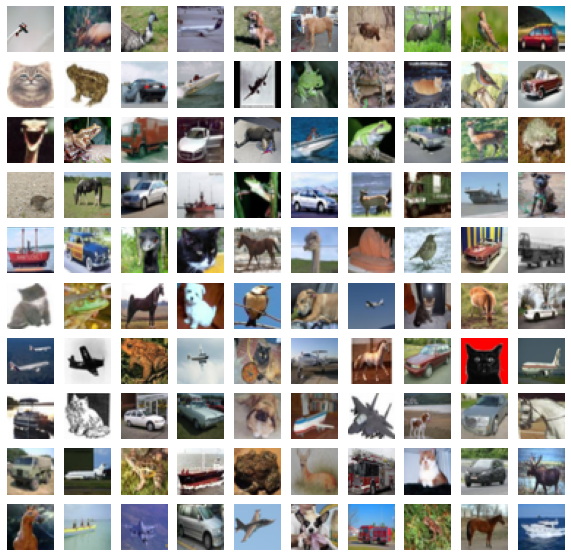

In [ ]:
rows  = 10
x = x_train.astype("uint8")

fig, axes1 = plt.subplots(rows, rows, figsize=(10,10) )

for j in range(rows):
    for k in range(rows):
        i = np.random.choice(range(len(x)))
        axes1[j][k].set_axis_off()
        axes1[j][k].imshow(x[i: i+1][0])

Construct Resnet

In [ ]:
# Training parameters
batch_Size = 32
epochs = 10
use_augmentation = True
num_classes = np.unique(y_train.shape[0])       # 10 output classes
colors = x_train.shape[3]

subtract_pixle_mean = True   # this will improve accuracy 

version = 1
depth = colors * 6 + 2

The following function implements a learning rate decay schedule.

In [ ]:
def lr_schedule(epoch):
    lr = 1e-3
    if epoch > 180:
        lr *= 0.5e-3
    elif epoch > 160:
        lr *= 1e-3
    elif epoch > 120:
        lr *= 1e-2
    elif epoch > 80:
        lr *= le-1
    return lr

In [ ]:
def resnet_layer(inputs,
                 num_filters = 16,
                 kernel_size = 3,
                 strides = 1,
                 activation = 'relu',
                 batch_normalization = True,
                 conv_first = True):
    conv = Conv2D(num_filters, 
                  kernel_size = kernel_size,
                  strides = strides,
                  padding ='same',
                  kernel_initializer = 'he_normal',
                  kernel_regularizer = l2(1e-4))
  
    x = inputs 
    if conv_first:
        x = conv(x)
        if batch_normalization:
            x = BatchNormalization()(x)
        if activation is not None:
            x = Activation(activation)(x)
    else:
        if batch_normalization:
            x = BatchNormalization()(x)
        if activation is not None:
            x = Activation(activation)(x)
        x = conv(x)
    return x

In [ ]:
def resnet_v1(input_shape, depth, num_classes = 10):
    """ Features maps sizes:
    stage 0: 32x32, 16
    stage 1: 16x16, 32
    stage 2:  8x8,  64"""
    if (depth - 2) % 6 !=0:
        raise ValueError('depth should be 6n+2 (eg 20, 32, 44 in [a])')
    # Start model definition 
    num_filters = 16
    num_res_blocks = int((depth - 2) / 6)
    inputs = Input()

## **Part 6.4: Using Your Own Images with Keras**

In [1]:
from PIL import Image, ImageFile
from matplotlib.pyplot import imshow
import requests
import numpy as np
from io import BytesIO
from IPython.display import display, HTML

In [78]:
def make_square(img, opt = 'crop'):
    cols, rows = img.size
    training_data = []
    img_data = np.asarray(img)
    im_pix_val = np.sum(np.sum(img_data, axis=0), axis= 0)

    pixle_size = cols * rows 
    av_pix = im_pix_val // pixle_size
    av_pix = tuple(av_pix)
    print(im_pix_val, "Length :", cols, rows,  "Pix size RxC :", pixle_size, "Av. pixle :", av_pix)
    #print(training_data, "length ", len(training_data))
    if opt == 'crop':
        if rows > cols:
            pad = (rows-cols)/2 
            img = img.crop((pad, 0, cols, cols) )
            print(f"Rows higher : {pad, 0, cols, cols, rows} ")
        else:
            pad = (cols - rows)/2 
            img = img.crop((0, pad, rows, rows))
            print(f"Cols higher  {0, pad, rows, rows, cols}"   )
    else:
        print("paste")
        if rows > cols:
            pad = (rows-cols)//2 
            result = Image.new(img.mode, (cols, cols), color= av_pix)
            result.paste(img, (pad, 0))
            img = result
        else:
            pad = (cols - rows)//2
            result =  Image.new(img.mode, (cols, cols), color = av_pix)  
            print(pad)
            result.paste(img, (0, pad))   
            img = result          
    return img


[623375744 590912979 565705103] Length : 2816 1834 Pix size RxC : 5164544 Av. pixle : (120, 114, 109)
paste
491


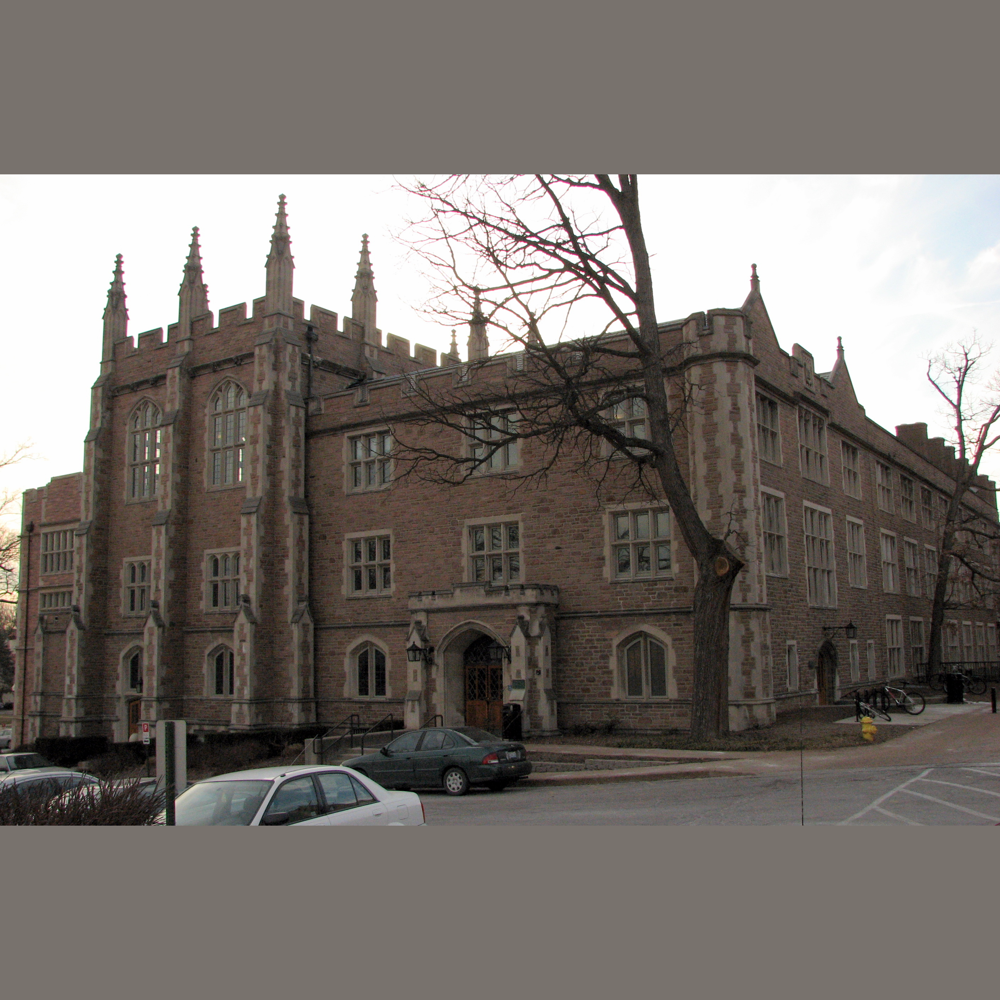

In [77]:
url = "https://upload.wikimedia.org/wikipedia/commons/c/c0/Brown_Hall.jpg"
#"https://upload.wikimedia.org/wikipedia/commons/9/92/Brookings.jpg"
response= requests.get(url)
img = Image.open(BytesIO(response.content))
img.load()
make_square(img, 'paste')

[ 94020891 101351716 101421144] Length : 1157 744 Pix size RxC : 860808 Av. pixle : (109, 117, 117)
paste
206


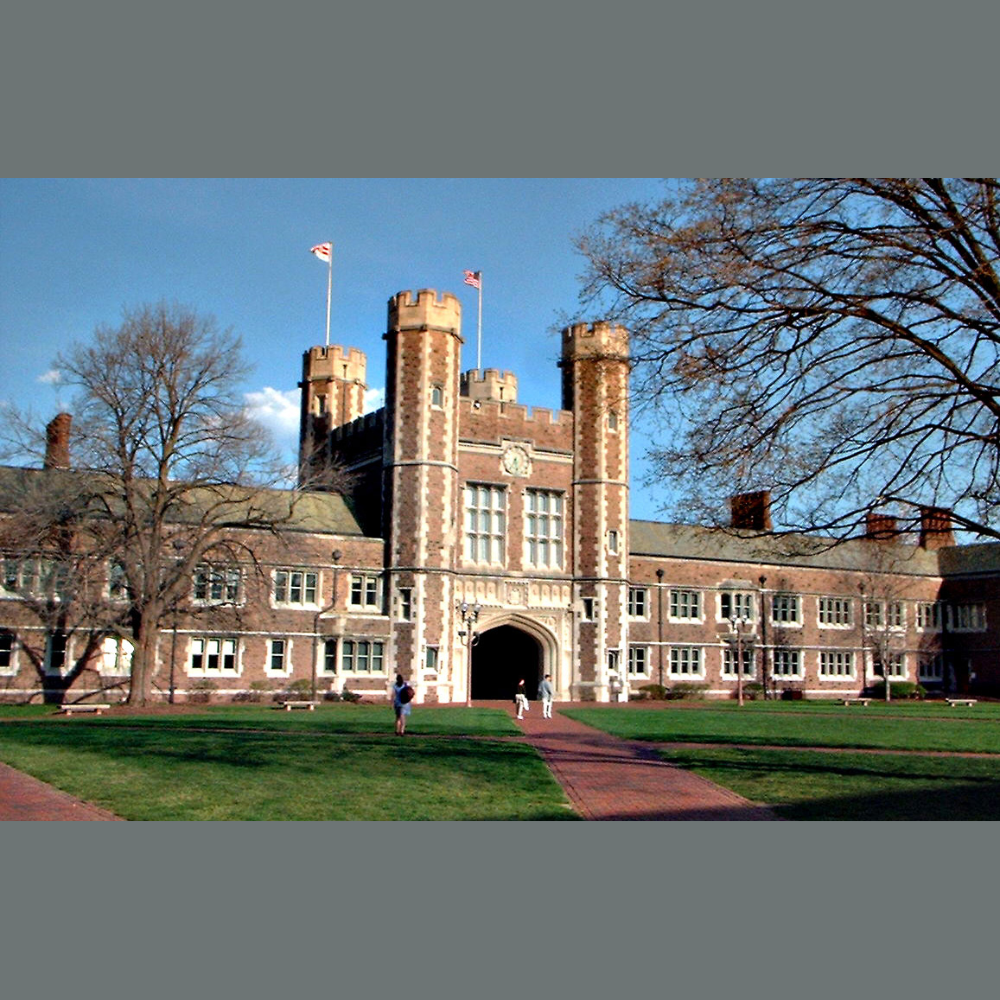

In [75]:
make_square(img, 'paste')

[ 94020891 101351716 101421144] Length : 1157 744 Pix size RxC : 860808 Av. pixle : (109, 117, 117)
paste
206


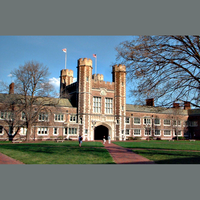

[ 904621526 1099146036 1116408753] Length : 3888 2592 Pix size RxC : 10077696 Av. pixle : (89, 109, 110)
paste
648


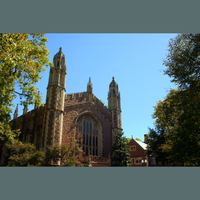

[1159176080 1085247214 1141279542] Length : 3888 2419 Pix size RxC : 9405072 Av. pixle : (123, 115, 121)
paste
734


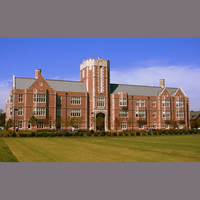

[360099918 414922297 476335806] Length : 2272 1704 Pix size RxC : 3871488 Av. pixle : (93, 107, 123)
paste
284


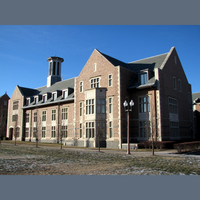

[ 995229766  979885964 1141277576] Length : 3700 2185 Pix size RxC : 8084500 Av. pixle : (123, 121, 141)
paste
757


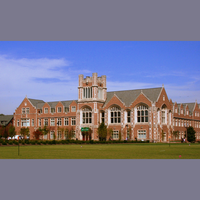

[623375744 590912979 565705103] Length : 2816 1834 Pix size RxC : 5164544 Av. pixle : (120, 114, 109)
paste
491


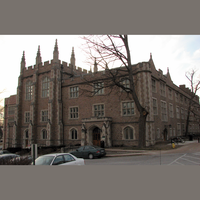

[519817360 498817045 496834613] Length : 2544 1696 Pix size RxC : 4314624 Av. pixle : (120, 115, 115)
paste
424


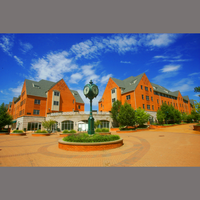

In [89]:
training_data = []
image_width = 200
image_height = 200
image_channels = 3

images = [
    "https://upload.wikimedia.org/wikipedia/commons/9/92/Brookings.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/f/ff/"\
    "WashU_Graham_Chapel.JPG",
    "https://upload.wikimedia.org/wikipedia/commons/9/9e/SeigleHall.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/a/aa/WUSTLKnight.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/3/32/WashUABhall.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/c/c0/Brown_Hall.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/f/f4/South40.jpg",
   
]

for url in images:
    ImageFile.LOAD_TRUNCATED_IMAGES = False
    response = requests.get(url)                    # these 2 lines are required as we are streaming from internet
    img = Image.open(BytesIO(response.content))
    img.load()
    img = make_square(img, 'paste')
    img = img.resize((image_width, image_height), Image.ANTIALIAS)
    training_data.append(np.asarray(img))
    display(img)

In [ ]:
training_data

Pass the data to np.array to convert the 1d / 3d image to 4d numpy array (number, RgB)

Normalize between -1 and 1 ---> divide by 127.5 and reduce by 1

In [ ]:
training_data = np.array(training_data) / 127.5 - 1

In [ ]:
training_data

array([[[[-0.12156863,  0.2627451 ,  0.59215686],
         [-0.12156863,  0.2627451 ,  0.59215686],
         [-0.10588235,  0.27058824,  0.59215686],
         ...,
         [-0.3254902 , -0.05098039,  0.27058824],
         [-0.61568627, -0.33333333,  0.01960784],
         [-0.40392157, -0.11372549,  0.20784314]],

        [[-0.16862745,  0.23921569,  0.59215686],
         [-0.14509804,  0.2627451 ,  0.61568627],
         [-0.11372549,  0.27058824,  0.59215686],
         ...,
         [-0.41176471, -0.25490196, -0.01960784],
         [-0.4745098 , -0.31764706, -0.02745098],
         [-0.81176471, -0.70196078, -0.42745098]],

        [[-0.15294118,  0.24705882,  0.60784314],
         [-0.1372549 ,  0.2627451 ,  0.62352941],
         [-0.10588235,  0.27058824,  0.6       ],
         ...,
         [-0.35686275, -0.15294118,  0.06666667],
         [-0.60784314, -0.37254902, -0.09803922],
         [-0.05882353,  0.18431373,  0.42745098]],

        ...,

        [[-0.00392157, -0.39607843, -0

store the data as nparray 

In [ ]:
print("Saving training Image binary .....")
np.save("training", training_data)
print("Done")

Saving training Image binary .....
Done


## **Part 6.5: Recognizing Multiple Images with Darknet**